<a href="https://colab.research.google.com/github/Atanu-2002/cognifyz-Internship-tasks/blob/main/task4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# prompt: mount drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd

# Replace 'Dataset.csv' with your actual filename or path
df = pd.read_csv('d.csv')

# Take a peek at the first rows to verify columns
print(df.head())


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [4]:
# Check if these columns exist
print(df.columns)

# Show first few coordinates
print(df[['Latitude', 'Longitude']].head())

# Remove rows with missing coordinates (optional but recommended)
df = df.dropna(subset=['Latitude', 'Longitude'])



Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')
    Latitude   Longitude
0  14.565443  121.027535
1  14.553708  121.014101
2  14.581404  121.056831
3  14.585318  121.056475
4  14.584450  121.057508


In [5]:
pip install folium


In [6]:
import folium


In [7]:
# Calculate average latitude and longitude for centering the map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]

# Create a folium map object
restaurant_map = folium.Map(location=map_center, zoom_start=12)


In [8]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=f"{row['Restaurant Name']} - {row['City']}",
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(restaurant_map)


In [9]:
restaurant_map.save('restaurants_map.html')


In [10]:
restaurant_map


In [11]:
from folium.plugins import MarkerCluster

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} - {row['City']}"
    ).add_to(marker_cluster)


In [12]:
# Count restaurants per city
city_counts = df['City'].value_counts()

print(city_counts.head(10))  # Top 10 cities by number of restaurants


City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64


In [13]:
# Count restaurants per locality
locality_counts = df['Locality'].value_counts()

print(locality_counts.head(10))  # Top 10 localities by restaurant count


Locality
Connaught Place        122
Rajouri Garden          99
Shahdara                87
Defence Colony          86
Malviya Nagar           85
Pitampura               85
Mayur Vihar Phase 1     84
Rajinder Nagar          81
Safdarjung              80
Satyaniketan            79
Name: count, dtype: int64


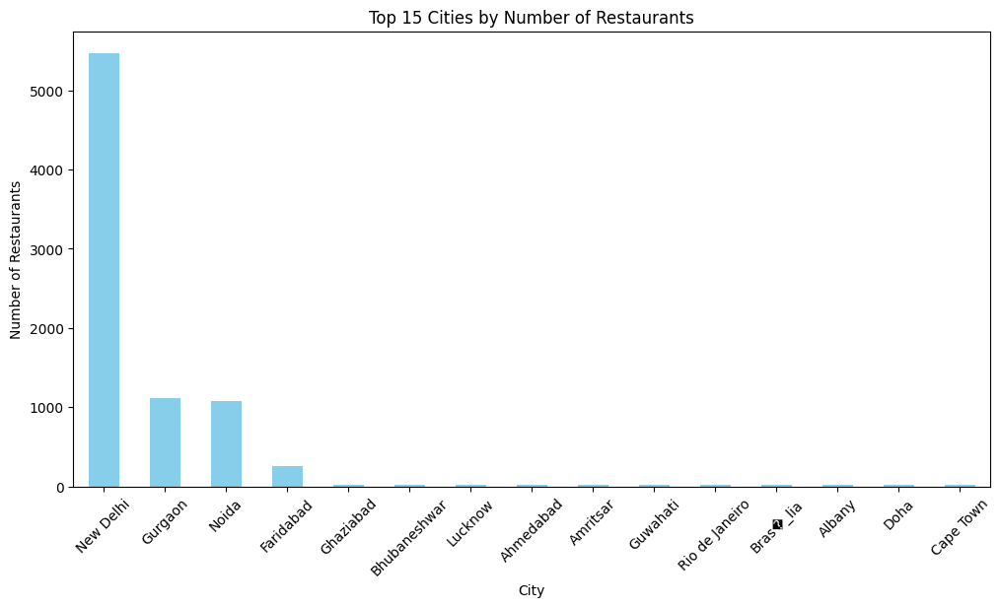

In [14]:
import matplotlib.pyplot as plt

city_counts.head(15).plot(kind='bar', figsize=(12,6), color='skyblue')
plt.title('Top 15 Cities by Number of Restaurants')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.show()


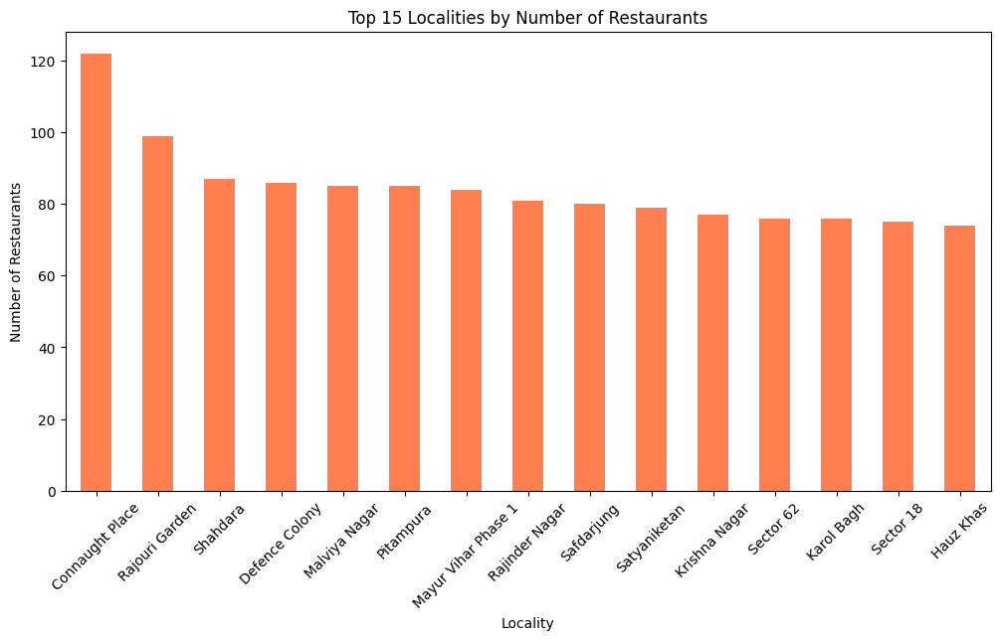

In [15]:
locality_counts.head(15).plot(kind='bar', figsize=(12,6), color='coral')
plt.title('Top 15 Localities by Number of Restaurants')
plt.xlabel('Locality')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.show()


In [16]:
# Percentage of total restaurants per city
city_percent = (city_counts / city_counts.sum()) * 100

print(city_percent.head(10))


City
New Delhi       57.302900
Gurgaon         11.705581
Noida           11.307716
Faridabad        2.627997
Ghaziabad        0.261753
Bhubaneshwar     0.219872
Lucknow          0.219872
Ahmedabad        0.219872
Amritsar         0.219872
Guwahati         0.219872
Name: count, dtype: float64


In [17]:
# Percentage of total restaurants per locality
locality_percent = (locality_counts / locality_counts.sum()) * 100

print(locality_percent.head(10))


Locality
Connaught Place        1.277353
Rajouri Garden         1.036541
Shahdara               0.910899
Defence Colony         0.900429
Malviya Nagar          0.889959
Pitampura              0.889959
Mayur Vihar Phase 1    0.879489
Rajinder Nagar         0.848079
Safdarjung             0.837609
Satyaniketan           0.827139
Name: count, dtype: float64


In [18]:
# Cities with less than 1% of total restaurants
low_conc_cities = city_percent[city_percent < 1]
print(low_conc_cities)

# Cities with more than 10% of total restaurants
high_conc_cities = city_percent[city_percent > 10]
print(high_conc_cities)


City
Ghaziabad         0.261753
Bhubaneshwar      0.219872
Lucknow           0.219872
Ahmedabad         0.219872
Amritsar          0.219872
                    ...   
Lakes Entrance    0.010470
Mohali            0.010470
Panchkula         0.010470
Bandung           0.010470
Randburg          0.010470
Name: count, Length: 137, dtype: float64
City
New Delhi    57.302900
Gurgaon      11.705581
Noida        11.307716
Name: count, dtype: float64


In [21]:
# Average rating by city
avg_rating_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print(avg_rating_city.head(10))

# Average rating by locality
avg_rating_locality = df.groupby('Locality')['Aggregate rating'].mean().sort_values(ascending=False)
print(avg_rating_locality.head(10))


City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Secunderabad        4.500000
Lincoln             4.500000
Name: Aggregate rating, dtype: float64
Locality
West Park                                      4.9
Aminabad                                       4.9
Venetian Village, Al Maqtaa                    4.9
Sofitel Philippine Plaza Manila, Pasay City    4.9
Setor De Clubes Esportivos Sul                 4.9
Taman Impian Jaya Ancol, Ancol                 4.9
The Milk District                              4.9
Paia                                           4.9
Old Dutch Hospital, Fort                       4.9
Pondok Aren                                    4.9
Name: Aggregate rating, dtype: float64


In [20]:
print(df.columns.tolist())


['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Aggregate rating', 'Rating color', 'Rating text', 'Votes']


In [23]:
# Average price range by city
avg_price_city = df.groupby('City')['Price range'].mean().sort_values(ascending=False)
print(avg_price_city.head(10))

# Average price range by locality
avg_price_locality = df.groupby('Locality')['Price range'].mean().sort_values(ascending=False)
print(avg_price_locality.head(10))


City
Panchkula           4.000000
Vineland Station    4.000000
Paynesville         4.000000
Johannesburg        4.000000
Inner City          4.000000
Pasay City          4.000000
Princeton           4.000000
Sandton             3.818182
Mandaluyong City    3.750000
Pretoria            3.700000
Name: Price range, dtype: float64
Locality
Abu Dhabi Mall, Tourist Club Area  (Al Zahiyah)    4.0
World Trade Center Mall, Al Markaziya              4.0
Taj Vivanta, Khan Market                           4.0
Lago Sul                                           4.0
Kuru�_e��me                                        4.0
Albemarle Street, Mayfair                          4.0
Al Wahda Mall, Al Wahda                            4.0
Al Qasba, Al Khan                                  4.0
Al Nasr                                            4.0
Al Hilal                                           4.0
Name: Price range, dtype: float64


In [25]:
print(df['Cuisines'].apply(type).value_counts())


Cuisines
<class 'str'>      9542
<class 'float'>       9
Name: count, dtype: int64


In [26]:
# First, drop or fill missing values (the floats)
df = df.dropna(subset=['Cuisines'])

# Convert strings to lists by splitting on ', '
df['Cuisines'] = df['Cuisines'].apply(lambda x: x.split(', '))


<ipython-input-26-92bdc7db60be>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cuisines'] = df['Cuisines'].apply(lambda x: x.split(', '))


In [27]:
from collections import Counter
import itertools

def popular_cuisines_by_group(df, group_col, top_n=10):
    grouped = df.groupby(group_col)['Cuisines'].apply(lambda x: list(itertools.chain.from_iterable(x)))
    cuisine_counts = grouped.apply(lambda cuisines: Counter(cuisines).most_common(top_n))
    return cuisine_counts

popular_cuisines_city = popular_cuisines_by_group(df, 'City')
print(popular_cuisines_city.head(5))


City
Abu Dhabi    [(Indian, 7), (American, 4), (Chinese, 3), (No...
Agra         [(North Indian, 15), (Mughlai, 9), (Chinese, 6...
Ahmedabad    [(Continental, 12), (Italian, 10), (North Indi...
Albany       [(American, 4), (Steak, 4), (Seafood, 3), (San...
Allahabad    [(North Indian, 12), (Fast Food, 8), (Chinese,...
Name: Cuisines, dtype: object


In [29]:
city_name = 'Ahmedabad'
print(f"Top cuisines in {city_name}:")
for cuisine, count in popular_cuisines_city[city_name][:3]:
    print(f"{cuisine}: {count}")


Top cuisines in Ahmedabad:
Continental: 12
Italian: 10
North Indian: 9


In [30]:
# Number of restaurants per city
restaurants_per_city = df['City'].value_counts()
print(restaurants_per_city.head(10))

# Number of restaurants per locality
restaurants_per_locality = df['Locality'].value_counts()
print(restaurants_per_locality.head(10))


City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Ahmedabad         21
Lucknow           21
Guwahati          21
Amritsar          21
Name: count, dtype: int64
Locality
Connaught Place        122
Rajouri Garden          99
Shahdara                87
Defence Colony          86
Pitampura               85
Malviya Nagar           85
Mayur Vihar Phase 1     84
Rajinder Nagar          81
Safdarjung              80
Satyaniketan            79
Name: count, dtype: int64


In [31]:
# Average rating per city
avg_rating_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print(avg_rating_city.head(10))

# Average price range per city (assuming 'Average Cost for two' is numeric)
avg_price_city = df.groupby('City')['Average Cost for two'].mean().sort_values(ascending=False)
print(avg_price_city.head(10))


City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Lincoln             4.500000
Tagaytay City       4.500000
Name: Aggregate rating, dtype: float64
City
Jakarta             308437.500000
Tangerang           250000.000000
Bogor               160000.000000
Bandung             150000.000000
Pasay City            3333.333333
Colombo               2375.000000
Panchkula             2000.000000
Mandaluyong City      2000.000000
Taguig City           1725.000000
Hyderabad             1361.111111
Name: Average Cost for two, dtype: float64


In [33]:
from collections import Counter
import itertools

# Convert cuisine strings to lists if needed
df.loc[:, 'Cuisines'] = df['Cuisines'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])

# Aggregate cuisines by city
cuisines_by_city = df.groupby('City')['Cuisines'].apply(lambda x: list(itertools.chain.from_iterable(x)))

# Get top 5 cuisines per city
top_cuisines_city = cuisines_by_city.apply(lambda cuisines: Counter(cuisines).most_common(5))
print(top_cuisines_city.head(10))


City
Abu Dhabi    []
Agra         []
Ahmedabad    []
Albany       []
Allahabad    []
Amritsar     []
Ankara       []
Armidale     []
Athens       []
Auckland     []
Name: Cuisines, dtype: object


In [35]:
from sklearn.cluster import DBSCAN
import numpy as np

# Extract rows with non-null latitude and longitude and keep their indices
coords_df = df[['Latitude', 'Longitude']].dropna()
coords = coords_df.to_numpy()

from sklearn.cluster import DBSCAN

db = DBSCAN(eps=0.01, min_samples=5).fit(coords)

# Assign cluster labels back to original df using the index of coords_df
df.loc[coords_df.index, 'Cluster'] = db.labels_

# Check cluster counts
print(df['Cluster'].value_counts())



Cluster
 62.0    4150
 43.0    1630
 45.0    1008
-1.0      938
 21.0     497
         ... 
 53.0       5
 68.0       5
 81.0       5
 90.0       5
 94.0       5
Name: count, Length: 96, dtype: int64
